In [52]:
import pandas as pd
import numpy as np
import seaborn as sns
 
from matplotlib import pyplot as plt
 
from sklearn.linear_model import LinearRegression
from sklearn.datasets import load_boston
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

In [5]:
data = pd.read_csv(load_boston()['filename'], skiprows=1)

In [6]:
print(load_boston()['DESCR'])

.. _boston_dataset:

Boston house prices dataset
---------------------------

**Data Set Characteristics:**  

    :Number of Instances: 506 

    :Number of Attributes: 13 numeric/categorical predictive. Median Value (attribute 14) is usually the target.

    :Attribute Information (in order):
        - CRIM     per capita crime rate by town
        - ZN       proportion of residential land zoned for lots over 25,000 sq.ft.
        - INDUS    proportion of non-retail business acres per town
        - CHAS     Charles River dummy variable (= 1 if tract bounds river; 0 otherwise)
        - NOX      nitric oxides concentration (parts per 10 million)
        - RM       average number of rooms per dwelling
        - AGE      proportion of owner-occupied units built prior to 1940
        - DIS      weighted distances to five Boston employment centres
        - RAD      index of accessibility to radial highways
        - TAX      full-value property-tax rate per $10,000
        - PTRATIO  pu

Прочитал, погуглил, осознал смысл колонок с данными. На первый взгляд очень хорошо подобранные признаки, нет лишних.

In [7]:
data.head()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
0,0.00632,18.0,2.31,0,0.538,6.575,65.2,4.0900,1,296,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0,0.469,6.421,78.9,4.9671,2,242,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0,0.469,7.185,61.1,4.9671,2,242,17.8,392.83,4.03,34.7
3,0.03237,0.0,2.18,0,0.458,6.998,45.8,6.0622,3,222,18.7,394.63,2.94,33.4
4,0.06905,0.0,2.18,0,0.458,7.147,54.2,6.0622,3,222,18.7,396.90,5.33,36.2


In [8]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 506 entries, 0 to 505
Data columns (total 14 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   CRIM     506 non-null    float64
 1   ZN       506 non-null    float64
 2   INDUS    506 non-null    float64
 3   CHAS     506 non-null    int64  
 4   NOX      506 non-null    float64
 5   RM       506 non-null    float64
 6   AGE      506 non-null    float64
 7   DIS      506 non-null    float64
 8   RAD      506 non-null    int64  
 9   TAX      506 non-null    int64  
 10  PTRATIO  506 non-null    float64
 11  B        506 non-null    float64
 12  LSTAT    506 non-null    float64
 13  MEDV     506 non-null    float64
dtypes: float64(11), int64(3)
memory usage: 55.5 KB


Посмотрел на данные - полные, заполнять нули не нужно. 
Точно нужно посмотреть их распределения. Может где есть выбросы, которые сместят распределения и поднимут ошибку модели.

Но сначала построим модель на необработанных данных, чтобы знать, ниже чего мы не должны опускаться в любом случае.

In [9]:
def get_score(X,y, random_seed=42, model=None):
  if model is None:
    model = LinearRegression()
  X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=random_seed )  
  model.fit(X_train, y_train)
  return model.score(X_test, y_test)

In [17]:
X_raw = data[[col for col in data.columns if col != 'MEDV']]
y_raw = data[['MEDV']]

In [18]:
get_score(X_raw, y_raw)

0.711226005748496

Scores  
no-data-preprocessing = 0.711226005748496  
rm/lstat = 0.7804882203838984 - только одно улучшение смог сделать. Странно.
 


Посмотрим зависимость и выбросы через pairplot

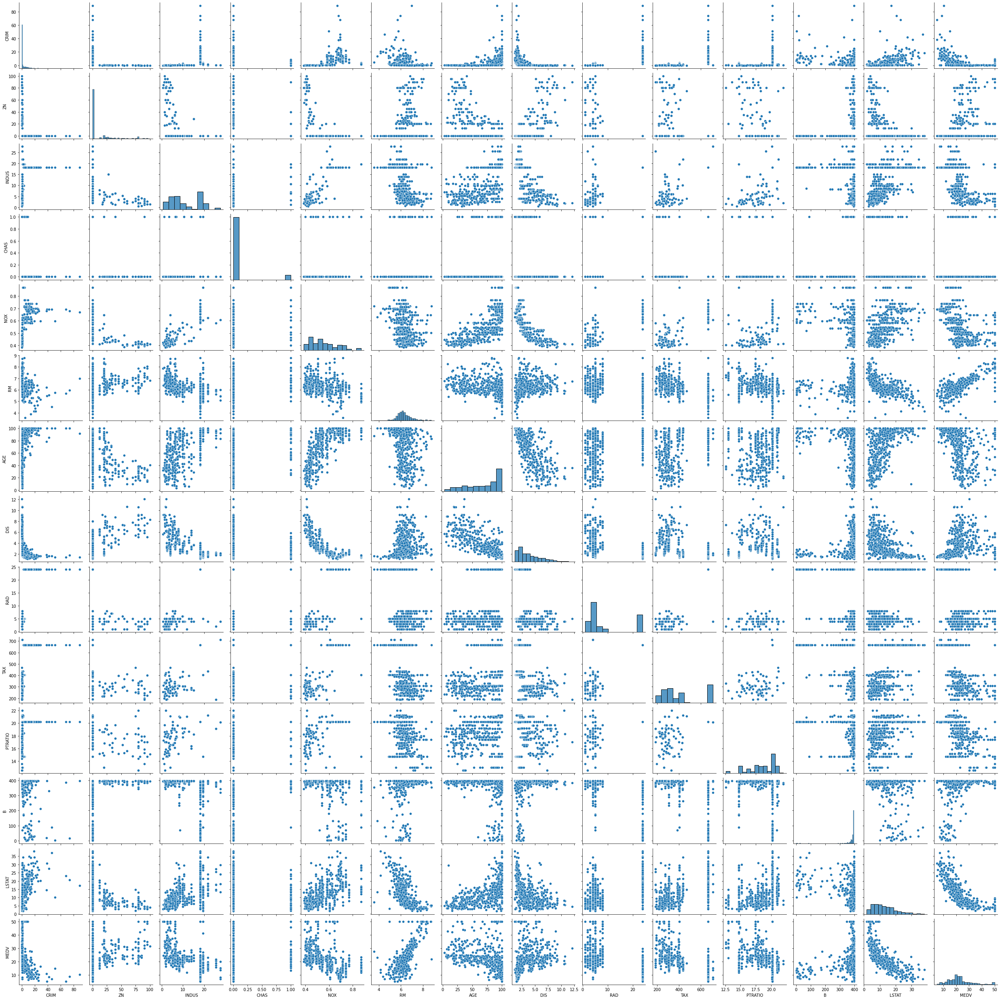

In [22]:
sns.pairplot(data)

Нормировать нужно все, где распределения близкие к нормальным.

По последней строке
https://prnt.sc/xndehh
видно, что скорее всего выбросы (или замененные нулями пустые значения) есть в столбцах  
* ZN 
* RM
* RAD
* TAX


Еще видно по последней строке, что есть линейная (скорее всего) зависимость от переменной RM и обратная зависисмость от переменной LSTAT.

Еще, вероятно, нужно исключить переменную CHAS - с этого и начнем. Потом пойдем по пунктам выше.

In [27]:
[col for col in data.columns if col not in ['MEDV','CHAS']]

['CRIM',
 'ZN',
 'INDUS',
 'NOX',
 'RM',
 'AGE',
 'DIS',
 'RAD',
 'TAX',
 'PTRATIO',
 'B',
 'LSTAT']

In [28]:
X = data[[col for col in data.columns if col not in ['MEDV','CHAS']]]
y = data[['MEDV']]
get_score(X, y)

0.7088141357902285

Стало хуже. Оставляем CHAS. (ниже переделаю ее на категориальную и применю one hot)

сделаем от LSTAT обратную переменную

In [30]:
data['rm_div_lstat'] = data['RM'] / data['LSTAT']
X = data[[col for col in data.columns if col not in ['MEDV']]]
y = data[['MEDV']]
get_score(X, y)

0.7804882203838984

Стало гораздо лучше! Продолжаем дальше - разбираемся с потенциальными выбросами в столбцах ZN, RM, RAD, TAX.
Соберем все подозрительные данные и попробуем только для них построить pairplot. Если на pairplot не будет видно зависимости MEDV, можно попробовать их все отбросить.

In [31]:
def get_boxplot(X, columns=[]):
  for i in columns:
    sns.boxplot(x=X[i])
  pass  

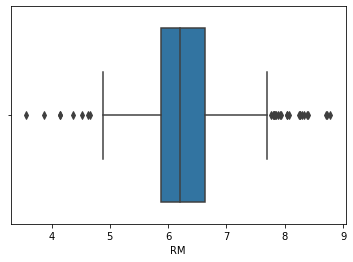

In [41]:
get_boxplot(X, columns=[
    # 'ZN', # есть подозрительный кусок хвоста - X[X.ZN>70]
#  'RM', # нормальные "полы" справа и слева
#   'RAD', # вообще ничего подозрительного на этой диаграмме
#    'TAX' # тоже ничего подозрительного на этой диаграмме
   ])

похоже, явных выбросов нет. 
Да и не особо это выбросы: много точек, нет единичных.
Скорее нужно взять нули и как-то их заполнить.


Категориальной можно считать CHAS. Делаю из нее две колонки.


In [43]:
def get_one_hot(X, cols):
    for each in cols:
        dummies = pd.get_dummies(X[each], prefix=each, drop_first=False)
        X = pd.concat([X, dummies], axis=1)
    return X

In [44]:
X = get_one_hot(X, cols=['CHAS'])
get_score(X, y)

0.7804882203839005

Ничего особо не поменялось - линейная регрессия хорошо справляется и так.  
Осталось посмотреть распределения и где они нормальные - прогнать через стандартизатор. Заодно попробуем поотбрасыывать хвосты.

https://habr.com/ru/post/331060/  
CRIM - скорее геометрическое распределение - с редкими "успехами" в виде преступлений. В основном значение = 0  
ZN - вообще не понятно что, вряд ли стоит нормировать. Много в 0, равномерный разброс до 100%.  
INDUS - выброс ли? в районе 17-18. Может отбросить вообще все после 16? Скор такой же, не будем отрезать  
NOX - более-менее равноменрное распределение, не буду нормировать  
RM - однозначно нормировать - странно. особо не помогло. 
AGE - пик на 100, спад медленный после 80. Не стандартное распределение. Какое?  
DIS - похоже на биномиальное или Пуассона: в нуле не 0  
RAD - выброс на 24. отрезать? - нет, стало только чуть хуже  
TAX - тоже отрезание не помогает. При отрезании образуются подозрительно одинаковые значения. Может это кластер один и тот же отрезается. хорошо бы исследовать, но не успею  
PTRATIO - не похоже на гаусса, один пик на ~ 21  
B - скорее геометрическое распределение "наборот" - от 100 спад вниз по значению  
LSTAT - скорее биномиальное (или Пуассон ?)

Вообще скорее всего не особо поможет стандартизация или какое-то приведения к другому распределению: данные уже одного порядка.  
Идей как кардинально улучшить результат не осатлось.

In [74]:
X.columns

Index(['CRIM', 'ZN', 'INDUS', 'CHAS', 'NOX', 'RM', 'AGE', 'DIS', 'RAD', 'TAX',
       'PTRATIO', 'B', 'LSTAT', 'rm_div_lstat', 'CHAS_0', 'CHAS_1'],
      dtype='object')

array([[<AxesSubplot:title={'center':'LSTAT'}>]], dtype=object)

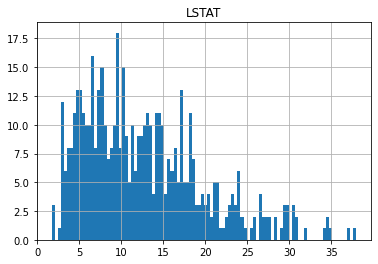

In [70]:
X.hist(column='LSTAT',bins=100)

In [58]:
# Проверка отбрасывания хвоста INDUS > 16
data_ = data[data['INDUS']<16]
X_ = data[[col for col in data.columns if col not in ['MEDV']]]
y_ = data[['MEDV']]
get_score(X_, y_)

0.7804882203838984

In [64]:
# Проверка отбрасывания хвоста RAD > 20
data_ = data[data['RAD']<20]
X_ = data[[col for col in data.columns if col not in ['MEDV']]]
y_ = data[['MEDV']]
get_score(X_, y_)

0.7804882203838984

In [67]:
# Проверка отбрасывания хвоста TAX > 20
data_ = data[data['TAX']<600]
X_ = data[[col for col in data.columns if col not in ['MEDV']]]
y_ = data[['MEDV']]
get_score(X_, y_)

0.7804882203838984

In [65]:
get_score(X, y)

0.7804882203839005

In [73]:
scaler = StandardScaler()

cols_to_norm = [
'RM',
 ]
df = data.copy()
df[cols_to_norm] = pd.DataFrame(scaler.fit_transform(df[cols_to_norm]),columns=cols_to_norm)
X_ = df[[col for col in df.columns if col not in ['MEDV']]]
y_ = df[['MEDV']]
get_score(X_, y_)

0.7804882203838983